In [1]:
pip install -e FindDirection

ERROR: FindDirection is not a valid editable requirement. It should either be a path to a local project or a VCS URL (beginning with bzr+http, bzr+https, bzr+ssh, bzr+sftp, bzr+ftp, bzr+lp, bzr+file, git+http, git+https, git+ssh, git+git, git+file, hg+file, hg+http, hg+https, hg+ssh, hg+static-http, svn+ssh, svn+http, svn+https, svn+svn, svn+file).
Note: you may need to restart the kernel to use updated packages.


In [2]:
import gym
gym.make('findirection:FindDirEnv-v0')

<OrderEnforcing<FindDirection_v0<FindDirEnv-v0>>>

In [3]:
import findirection
env = gym.make('findirection:FindDirEnv-v0')

In [4]:
# set this true to train the model
# - otherwise it will try to load a pre-trained model
TRAIN_MODEL = True

# the name of the environment to create
Environment_Name = "FindDirEnv-v1"

# define where the model should be written
model_dir = 'Models/'

In [5]:
!pip install -q ipycanvas==0.11 -q
!pip install stable-baselines3 -q

In [6]:
import os
import numpy as np
import gym
from stable_baselines3.common.env_checker import check_env

(MainThread) NumExpr defaulting to 8 threads.
(MainThread) matplotlib data path: /Users/tanya/opt/anaconda3/lib/python3.9/site-packages/matplotlib/mpl-data
(MainThread) CONFIGDIR=/Users/tanya/.matplotlib
(MainThread) interactive is False
(MainThread) platform is darwin
(MainThread) loaded modules: ['sys', 'builtins', '_frozen_importlib', '_imp', '_thread', '_warnings', '_weakref', '_io', 'marshal', 'posix', '_frozen_importlib_external', 'time', 'zipimport', '_codecs', 'codecs', 'encodings.aliases', 'encodings', 'encodings.utf_8', '_signal', 'encodings.latin_1', '_abc', 'abc', 'io', '__main__', '_stat', 'stat', '_collections_abc', 'genericpath', 'posixpath', 'os.path', 'os', '_sitebuiltins', '_locale', '_bootlocale', '_distutils_hack', 'types', 'importlib._bootstrap', 'importlib._bootstrap_external', 'warnings', 'importlib', 'importlib.machinery', '_heapq', 'heapq', 'itertools', 'keyword', '_operator', 'operator', 'reprlib', '_collections', 'collections', 'collections.abc', '_functools'

In [7]:
# create the specified environment with a discrete action space
setup = {'action_space':'discrete'}
env = gym.make(Environment_Name,**setup)

# use StableBaselines to check the environment
# - returns nothing if the environment is verified as ok
check_env(env)

In [8]:
from findirection.envs.fd1_env import FindDirection_v1

In [9]:
setup = { 'width': 6,
          'height': 6,
          'add_maze': True,
          'maze_seed': 42,
          'end': [5,5]
        }       

puddles = [((1,1),2),           
           ((3,1),2),
           ((4,2),2),
           ((0,3),2),
           ((2,4),2),
           ((1,5),2),]
setup['puddles'] = puddles

setup['side_panel'] = {'width':200}


In [17]:
env = gym.make(Environment_Name,**setup)
env.render()

MultiCanvas(height=388, sync_image_data=True, width=588)

In [65]:
from stable_baselines3 import PPO
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.env_util import make_vec_env

In [18]:
print("\n _____ACTION SPACE_____ \n")
print("Action Space Shape", env.action_space.n)
print("Action Space Sample", env.action_space.sample()) # Take a random action

print("\n_____OBSERVATION SPACE_____ \n")
print("Observation Space Shape", env.observation_space)
print("Sample observation", env.observation_space.sample()) # Get a random observation


 _____ACTION SPACE_____ 

Action Space Shape 5
Action Space Sample 3

_____OBSERVATION SPACE_____ 

Observation Space Shape MultiDiscrete([6 6])
Sample observation [2 5]


In [66]:
model = PPO('MlpPolicy', env, verbose=1)

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


In [67]:
%%time

# test if the model should be trained
if TRAIN_MODEL:

  # Train the agent
  model.learn(total_timesteps=500_000)

  # Save the trained model
  model.save(f"{model_dir}/{Environment_Name}_ppo")

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 61.5     |
|    ep_rew_mean     | -68.5    |
| time/              |          |
|    fps             | 5110     |
|    iterations      | 1        |
|    time_elapsed    | 0        |
|    total_timesteps | 2048     |
---------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 52.1        |
|    ep_rew_mean          | -57.2       |
| time/                   |             |
|    fps                  | 3664        |
|    iterations           | 2           |
|    time_elapsed         | 1           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.011293361 |
|    clip_fraction        | 0.0908      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.6        |
|    explained_variance   | 0.0111      |
|    learning_rate        | 0.

In [68]:
model = PPO.load(f"{model_dir}/{Environment_Name}_ppo", print_system_info=True)

== CURRENT SYSTEM INFO ==
OS: macOS-12.3-arm64-arm-64bit Darwin Kernel Version 21.4.0: Mon Feb 21 20:35:58 PST 2022; root:xnu-8020.101.4~2/RELEASE_ARM64_T6000
Python: 3.9.13
Stable-Baselines3: 1.6.2
PyTorch: 1.13.0
GPU Enabled: False
Numpy: 1.23.4
Gym: 0.21.0

== SAVED MODEL SYSTEM INFO ==
OS: macOS-12.3-arm64-arm-64bit Darwin Kernel Version 21.4.0: Mon Feb 21 20:35:58 PST 2022; root:xnu-8020.101.4~2/RELEASE_ARM64_T6000
Python: 3.9.13
Stable-Baselines3: 1.6.2
PyTorch: 1.13.0
GPU Enabled: False
Numpy: 1.23.4
Gym: 0.21.0



In [69]:
obs = env.reset()
total_reward_PPO = []
for j in range(1000):
    rw = 0
    env.reset()
    for i in range(1000):
        action, _states = model.predict(obs)
        obs, rewards, done, info = env.step(action)
        rw = rw + rewards 
        if done:
            total_reward_PPO.append(rw)
            rw = 0 
            break       
print(total_reward_PPO)

[-6, -6, -6, -6, -6, -6, -13, -6, -6, -6, -7, -7, -8, -10, -6, -6, -8, -6, -6, -6, -6, -6, -6, -6, -7, -9, -6, -6, -6, -8, -6, -6, -6, -9, -6, -7, -6, -6, -9, -6, -6, -6, -6, -7, -6, -7, -6, -6, -9, -6, -6, -6, -7, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -7, -9, -6, -6, -8, -6, -6, -6, -6, -7, -6, -6, -6, -6, -10, -6, -6, -6, -6, -6, -6, -6, -7, -8, -7, -6, -7, -6, -6, -8, -6, -6, -9, -6, -7, -9, -6, -6, -6, -6, -6, -6, -6, -6, -6, -8, -7, -7, -11, -6, -6, -11, -6, -8, -8, -6, -6, -6, -7, -6, -6, -9, -8, -6, -6, -9, -7, -10, -6, -8, -6, -6, -6, -6, -7, -6, -6, -7, -6, -6, -6, -6, -6, -6, -6, -6, -6, -7, -6, -8, -6, -6, -6, -6, -6, -8, -6, -6, -9, -6, -6, -9, -6, -6, -7, -6, -6, -6, -7, -6, -6, -6, -6, -7, -6, -9, -6, -6, -6, -6, -6, -6, -6, -7, -6, -6, -6, -6, -7, -6, -7, -6, -6, -6, -6, -6, -9, -7, -6, -6, -6, -6, -7, -10, -10, -6, -8, -6, -6, -7, -6, -6, -6, -6, -6, -6, -6, -11, -6, -6, -6, -6, -7, -7, -6, -10, -6, -6, -6, -8, -9, -6, -6, -6, -11, -6, -6, -6, -7, -7, -6, -6, -6, -6, 

In [79]:
import numpy as np
mean_reward_PPO = np.mean(total_reward_PPO)
st_reward_PPO = np.std(total_reward_PPO)
print(mean_reward_PPO, st_reward_PPO )

-6.609 1.382070548126976


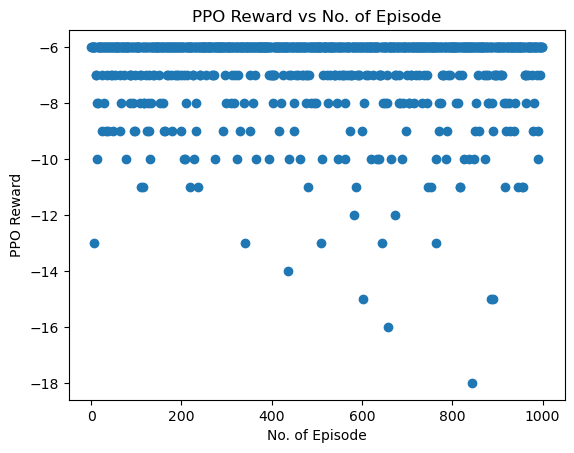

In [71]:
from matplotlib import pyplot as plt
x = list(range(1000))
plt.scatter(x,total_reward_PPO)

plt.ylabel('PPO Reward')
plt.xlabel('No. of Episode')
plt.title('PPO Reward vs No. of Episode')
plt.show()

In [73]:
from stable_baselines3 import DQN
model = DQN("MlpPolicy", env, verbose=1)
model.learn(total_timesteps=500_000, log_interval=4)
model.save("dqn_findir")

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 25       |
|    ep_rew_mean      | -27.2    |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 6908     |
|    time_elapsed     | 0        |
|    total_timesteps  | 100      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 38.1     |
|    ep_rew_mean      | -41.9    |
|    exploration_rate | 0.994    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 9113     |
|    time_elapsed     | 0        |
|    total_timesteps  | 305      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 43.9     |
|    ep_rew_mean      | -47.7  

In [74]:
model =DQN.load("dqn_findir", print_system_info=True)

== CURRENT SYSTEM INFO ==
OS: macOS-12.3-arm64-arm-64bit Darwin Kernel Version 21.4.0: Mon Feb 21 20:35:58 PST 2022; root:xnu-8020.101.4~2/RELEASE_ARM64_T6000
Python: 3.9.13
Stable-Baselines3: 1.6.2
PyTorch: 1.13.0
GPU Enabled: False
Numpy: 1.23.4
Gym: 0.21.0

== SAVED MODEL SYSTEM INFO ==
OS: macOS-12.3-arm64-arm-64bit Darwin Kernel Version 21.4.0: Mon Feb 21 20:35:58 PST 2022; root:xnu-8020.101.4~2/RELEASE_ARM64_T6000
Python: 3.9.13
Stable-Baselines3: 1.6.2
PyTorch: 1.13.0
GPU Enabled: False
Numpy: 1.23.4
Gym: 0.21.0



In [75]:
obs = env.reset()
total_reward_DQN = []
for j in range(1000):
    rw = 0
    env.reset()
    for i in range(1000):
        action, _states = model.predict(obs)
        obs, rewards, done, info = env.step(action)
        rw = rw + rewards 
        if done:
            total_reward_DQN.append(rw)
            rw = 0 
            break       
print(total_reward_DQN)

[-6, -7, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -8, -6, -6, -6, -7, -7, -7, -6, -6, -6, -8, -6, -6, -6, -8, -6, -6, -6, -6, -6, -6, -6, -6, -6, -7, -6, -6, -6, -6, -6, -6, -6, -7, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -8, -6, -9, -6, -8, -6, -6, -6, -6, -8, -6, -6, -6, -6, -7, -6, -6, -6, -6, -7, -9, -6, -6, -6, -6, -6, -6, -6, -6, -6, -7, -6, -6, -6, -6, -6, -6, -7, -6, -6, -6, -6, -6, -6, -7, -6, -6, -6, -6, -6, -6, -6, -6, -6, -7, -6, -6, -6, -6, -6, -8, -6, -6, -6, -8, -6, -6, -6, -6, -6, -6, -7, -6, -6, -7, -6, -6, -7, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -9, -6, -6, -6, -6, -6, -6, -6, -7, -6, -6, -6, -6, -6, -7, -7, -6, -11, -6, -6, -6, -7, -6, -6, -6, -6, -6, -6, -6, -6, -6, -8, -6, -8, -7, -8, -7, -6, -6, -10, -7, -6, -6, -6, -7, -6, -6, -6, -8, -6, -6, -6, -7, -6, -6, -6, -7, -6, -6, -6, -6, -8, -6, -6, -6, -6, -7, -6, -7, -6, -6, -8, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -6, -7, -6, -8, -6, -6, -6, -8, -6, -

In [78]:
import numpy as np
mean_reward_DQN = np.mean(total_reward_DQN)
st_reward_DQN = np.std(total_reward_DQN)
print(mean_reward_DQN, st_reward_DQN )

-6.302 0.7568328745502537


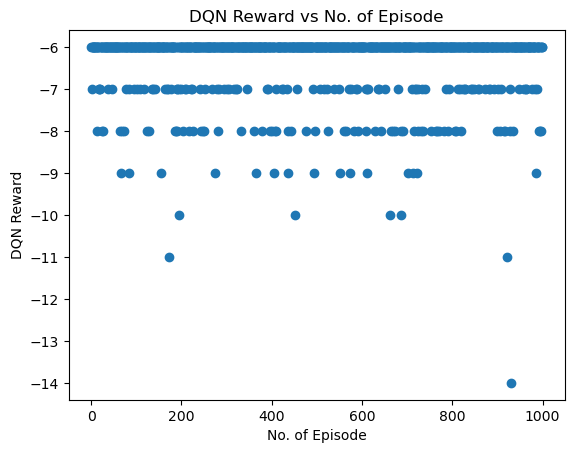

In [77]:
from matplotlib import pyplot as plt
x = list(range(1000))
plt.scatter(x,total_reward_DQN)

plt.ylabel('DQN Reward')
plt.xlabel('No. of Episode')
plt.title('DQN Reward vs No. of Episode')
plt.show()